<a href="https://colab.research.google.com/github/sc0v0ne/ExploreNeuralNetworks/blob/main/Explore_SAHI_YOLO_Slicing_Aided_Hyper_Inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SAHI: Slicing Aided Hyper Inference


- [SAHI: Slicing Aided Hyper Inference](https://github.com/obss/sahi)
- [Slicing Aided Hyper Inference and Fine-Tuning for Small Object Detection](https://ieeexplore.ieee.org/document/9897990)

In [1]:
!pip install -U torch sahi yolov5  --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.1/779.1 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.4/953.4 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.2/176.2 MB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.1/168.1 MB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.4/756.4 kB 42.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 17.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 M

--------

# Images Testing


[Images from pexels](https://www.pexels.com)

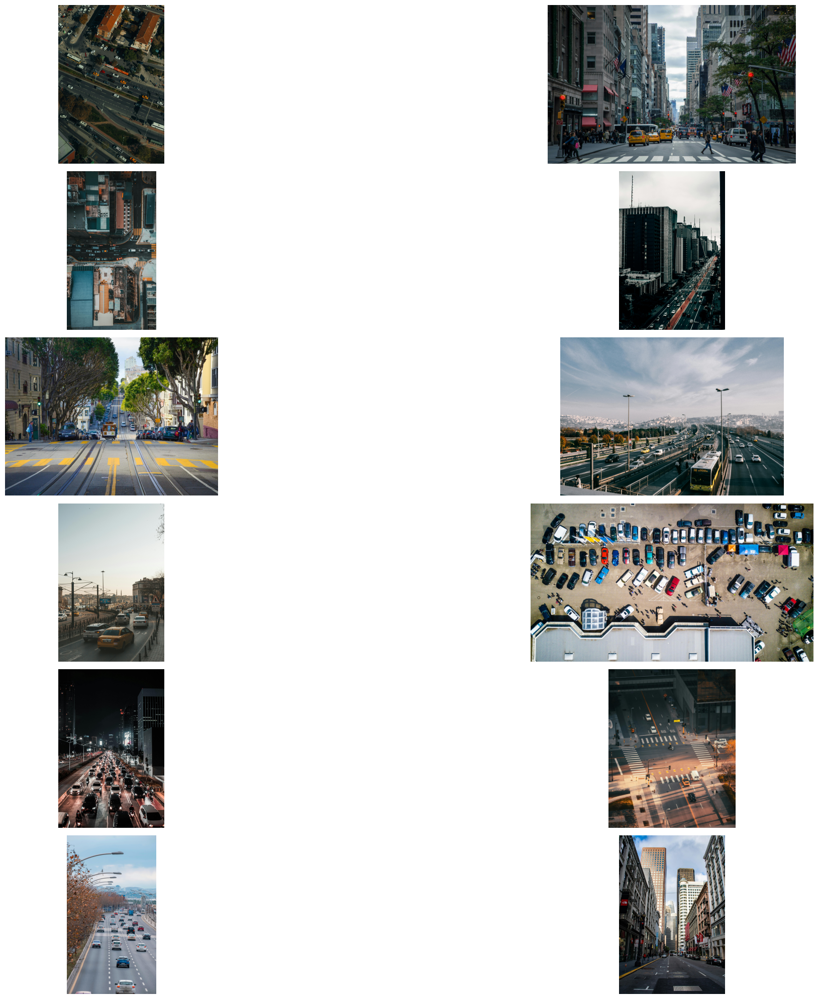

In [3]:
from PIL import Image
import matplotlib.pyplot as plt
import os
%matplotlib inline
imgs = []
for i in  os.listdir('/content/sahi-images/'):
    img_path = f'/content/sahi-images/{i}'
    imgs.append(Image.open(img_path))

fig, axs = plt.subplots(6, 2, figsize=(30, 20))

for i, ax in enumerate(axs.flat):
    ax.imshow(imgs[i])
    ax.axis('off')


plt.tight_layout()
plt.show()

------------

# Explore

In [4]:
import os
os.getcwd()

'/content'

In [5]:
from sahi.utils.yolov5 import (
    download_yolov5s6_model,
)

from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

In [6]:
yolov5_model_path = 'models/yolov5s6.pt'
download_yolov5s6_model(destination_path=yolov5_model_path)

In [7]:
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=yolov5_model_path,
    confidence_threshold=0.3,
    device="cpu", # or 'cuda:0'
)

-----------

## Simple prediction

In [25]:
def multi_prediction(detection_model, path_images):
    group_imgs = {}
    for i, img_ in enumerate(os.listdir(path_images)):
        group_imgs[i] =  {}
        group_imgs[i]['name'] = img_
        result = get_prediction(f"{path_images}/{img_}", detection_model)
        group_imgs[i]['result_simple'] = result
        result.export_visuals(export_dir="/content/results/", file_name=f'img_testing{i}_1')

        result = get_sliced_prediction(
            f"{path_images}/{img_}",
            detection_model,
            slice_height = 256,
            slice_width = 256,
            overlap_height_ratio = 0.2,
            overlap_width_ratio = 0.2
        )
        group_imgs[i]['result_slice'] = result
        result.export_visuals(export_dir="/content/results/", file_name=f'img_testing{i}_2')
    return group_imgs

In [27]:
group_imgs = multi_prediction(detection_model, '/content/sahi-images')

Performing prediction on 600 number of slices.
Performing prediction on 400 number of slices.
Performing prediction on 144 number of slices.
Performing prediction on 600 number of slices.
Performing prediction on 300 number of slices.
Performing prediction on 368 number of slices.
Performing prediction on 442 number of slices.
Performing prediction on 209 number of slices.
Performing prediction on 600 number of slices.
Performing prediction on 396 number of slices.
Performing prediction on 286 number of slices.
Performing prediction on 486 number of slices.


In [28]:
from PIL import Image
import matplotlib.pyplot as plt

def view_images(path_img1, path_img2):

    img1 = Image.open(path_img1)
    img2 = Image.open(path_img2)

    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.imshow(img1)
    plt.axis('off')
    plt.title(f'Simple: {path_img1}')

    plt.subplot(1, 2, 2)
    plt.imshow(img2)
    plt.axis('off')
    plt.title(f'Slice: {path_img2}')

    plt.show()

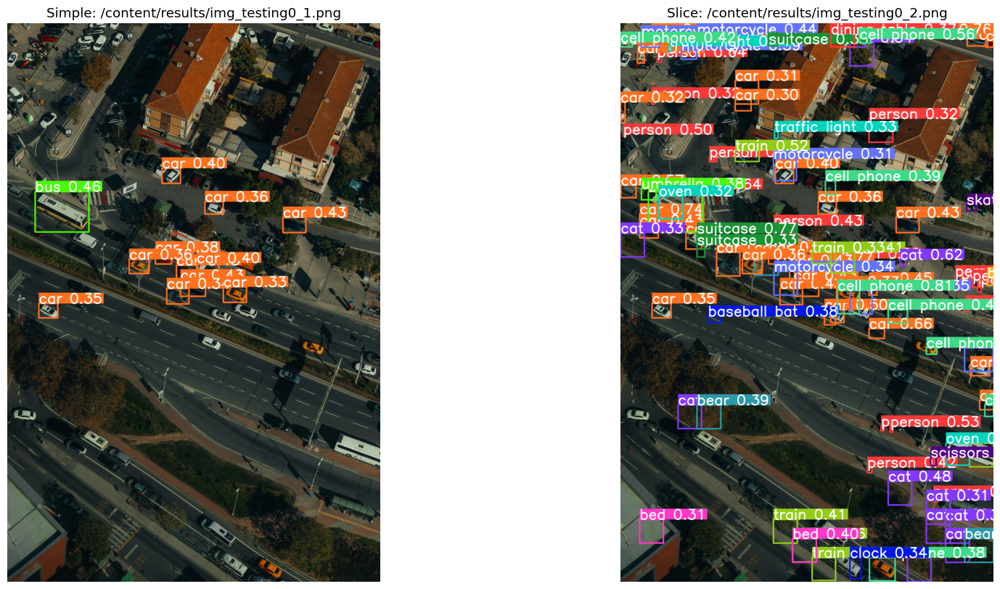

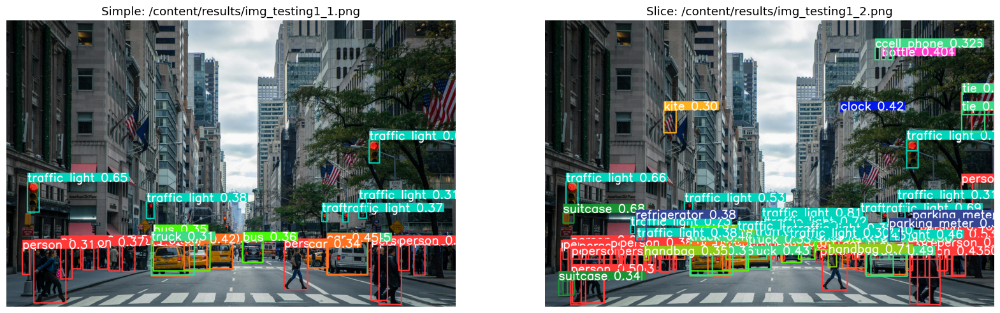

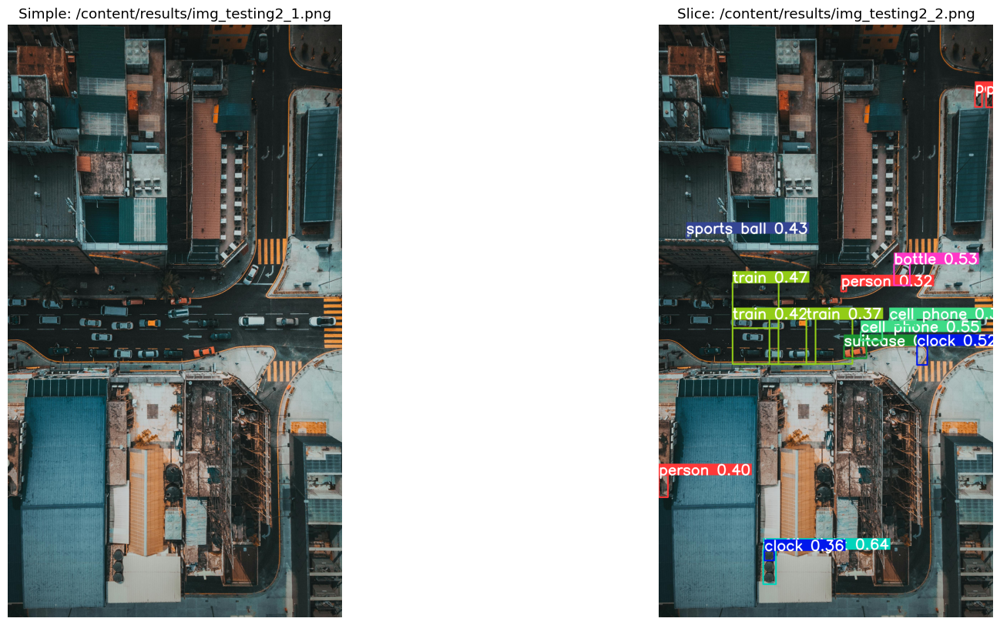

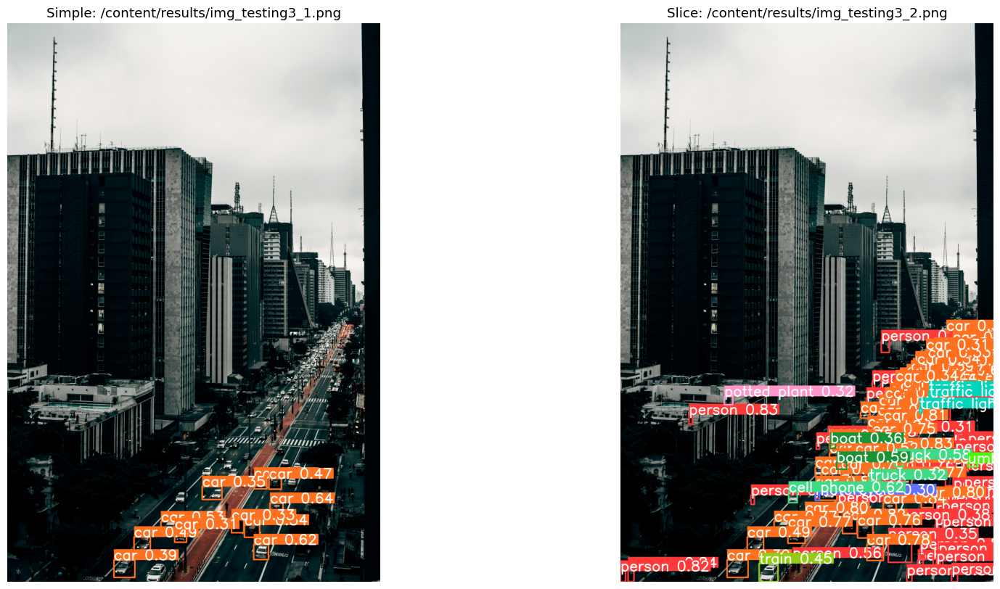

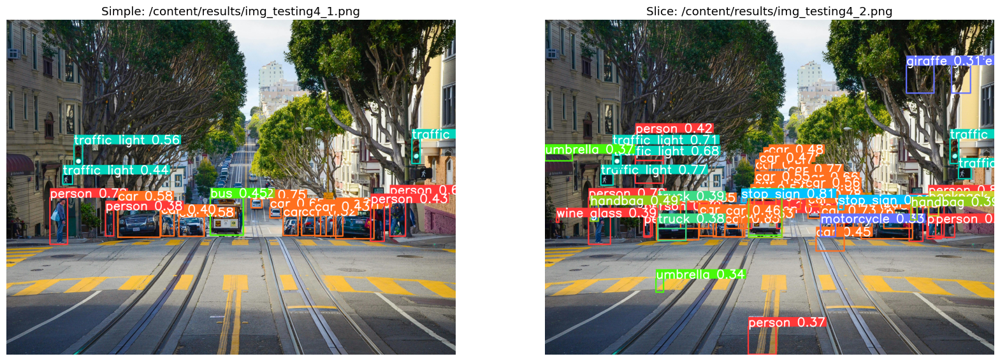

...

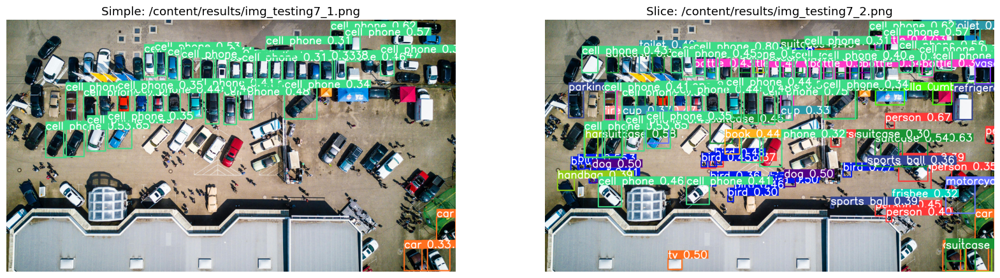

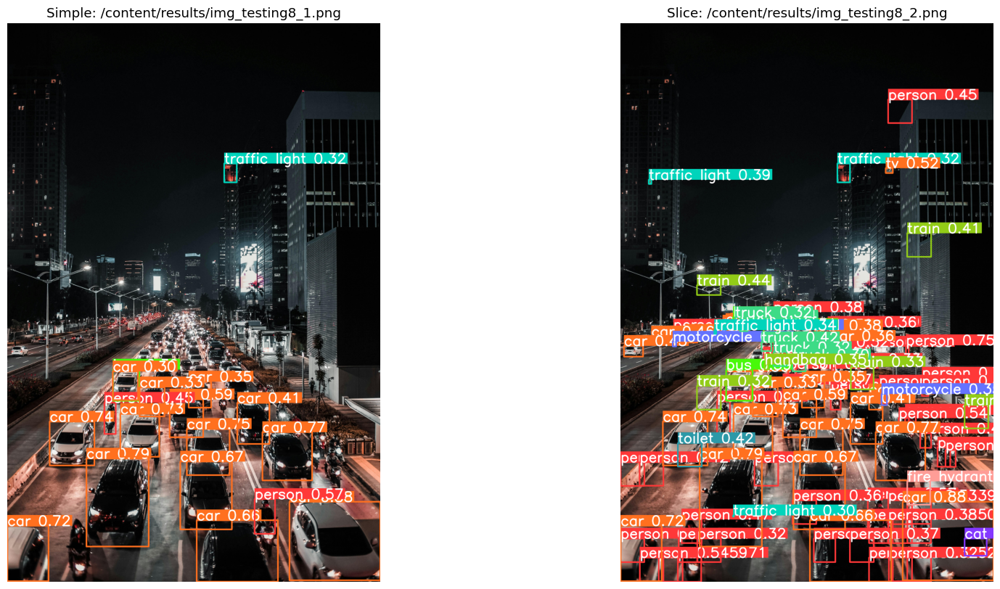

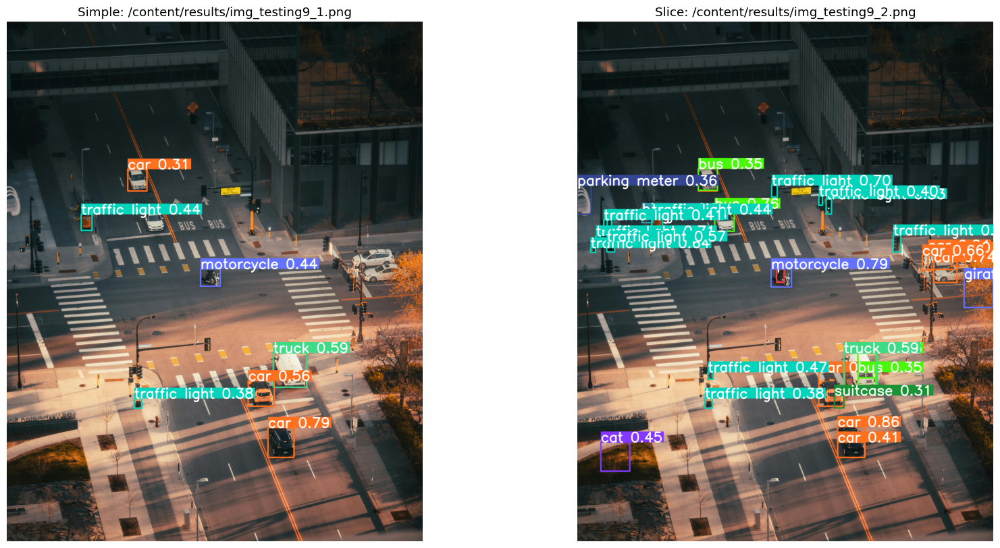

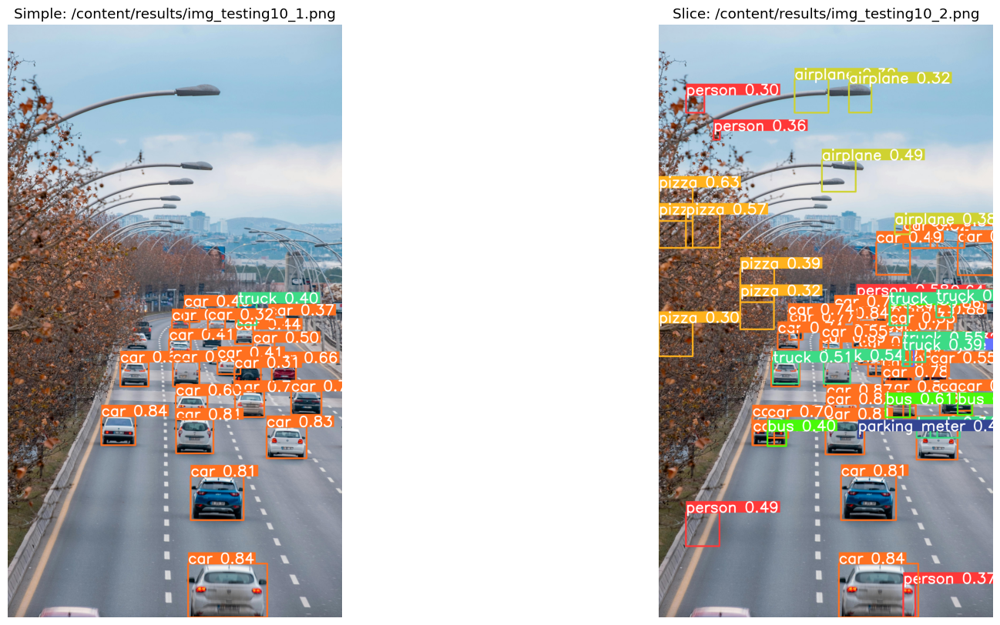

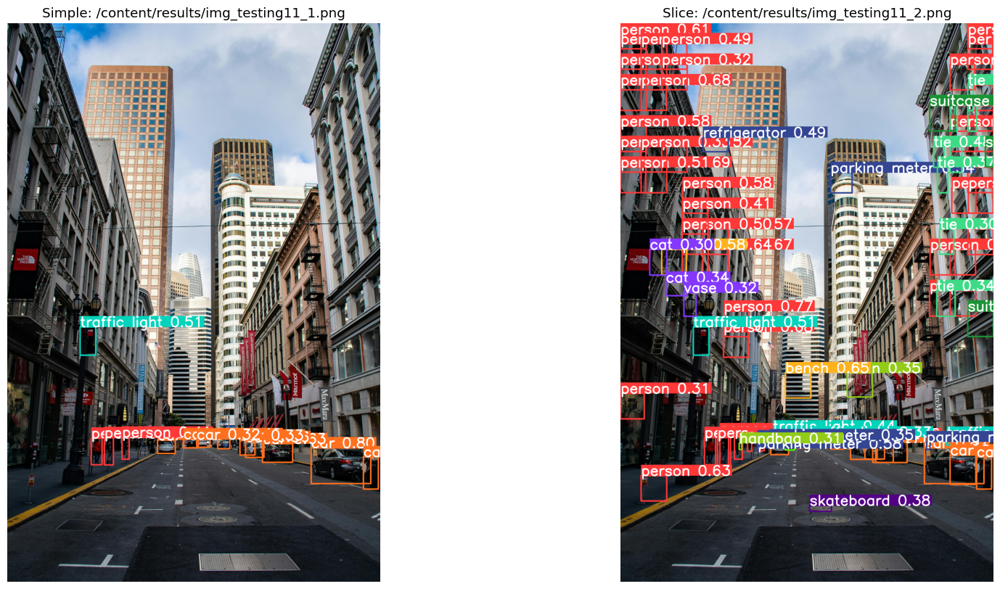

In [31]:
for i in range(len(os.listdir('/content/sahi-images'))):
    view_images(
        f'/content/results/img_testing{i}_1.png',
        f'/content/results/img_testing{i}_2.png'
    )

In [33]:
group_imgs

{0: {'name': 'pexels-ana-maria-antonenco-78158389-19920219.jpg',
  'result_simple': <sahi.prediction.PredictionResult at 0x7bb906672080>,
  'result_slice': <sahi.prediction.PredictionResult at 0x7bb91690a440>},
 1: {'name': 'pexels-nout-gons-80280-378570.jpg',
  'result_simple': <sahi.prediction.PredictionResult at 0x7bb90675c190>,
  'result_slice': <sahi.prediction.PredictionResult at 0x7bb9168ec640>},
 2: {'name': 'pexels-darshan394-1003870.jpg',
  'result_simple': <sahi.prediction.PredictionResult at 0x7bb918933fd0>,
  'result_slice': <sahi.prediction.PredictionResult at 0x7bb916908400>},
 3: {'name': 'pexels-ianporce-72479.jpg',
  'result_simple': <sahi.prediction.PredictionResult at 0x7bb918930160>,
  'result_slice': <sahi.prediction.PredictionResult at 0x7bb91694f5e0>},
 4: {'name': 'pexels-pixabay-258447.jpg',
  'result_simple': <sahi.prediction.PredictionResult at 0x7bb91691a7a0>,
  'result_slice': <sahi.prediction.PredictionResult at 0x7bb91689fdf0>},
 5: {'name': 'pexels-meru

In [40]:
print(len(group_imgs))

12


In [ ]:
for i in range(len(group_imgs) -1):
    rst = group_imgs[i]['result_simple']
    group_imgs[i]['result_simple'] = rst.to_coco_annotations()
    rst = group_imgs[i]['result_slice']
    group_imgs[i]['result_slice'] = rst.to_coco_annotations()

In [48]:
group_imgs

{0: {'name': 'pexels-ana-maria-antonenco-78158389-19920219.jpg',
  'result_simple': [{'image_id': None,
    'bbox': [299.30499267578125,
     1808.1329345703125,
     576.4498901367188,
     434.5987548828125],
    'score': 0.46036091446876526,
    'category_id': 5,
    'category_name': 'bus',
    'segmentation': [],
    'iscrowd': 0,
    'area': 250524},
   {'image_id': None,
    'bbox': [1857.1295166015625,
     2758.531005859375,
     267.9217529296875,
     175.199951171875],
    'score': 0.42983680963516235,
    'category_id': 2,
    'category_name': 'car',
    'segmentation': [],
    'iscrowd': 0,
    'area': 46939},
   {'image_id': None,
    'bbox': [2956.369384765625,
     2085.2939453125,
     246.3642578125,
     164.277587890625],
    'score': 0.42970573902130127,
    'category_id': 2,
    'category_name': 'car',
    'segmentation': [],
    'iscrowd': 0,
    'area': 40472},
   {'image_id': None,
    'bbox': [1814.9788818359375,
     2599.5087890625,
     227.0238037109375,
 

In [49]:
import json
output_json = "rst_sahi.json"

with open(output_json, "w") as f:
    json.dump(group_imgs, f)